In [229]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 

%matplotlib inline

In [230]:
data = pd.read_csv('train.csv')
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [231]:
# let's find the info() about the data which will give us the datatypes 
data.info()
# description of the data
data.describe().T
# let's drop those columns which have the object as data type since 
# we don't really want it to fit the model and Exploration as well
#for c in train.columns:
data = data.select_dtypes(exclude=['object'])
data.head() 
print(data.isnull().sum())
# so it is clear LotFrontage and Garageyrblt has null values
# let's drop the column LotFrontage and for GarageYrBlt let's replace Na with mean
data.drop('LotFrontage', inplace=True, axis=1)
## droping the futher missing values
data.dropna(axis=0, inplace=True)
print('Number of rows and columns',data.shape)
print(data.isnull().sum())
# removing the outliers 
from scipy import stats
idx = np.all(stats.zscore(data) < 3, axis=1)

# clean the data with idx 
data_cleaned = data[idx]
print('data with outliers',data.shape)
print('cleaned data',data_cleaned.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [232]:
# cleaned data
data_cleaned.head()

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
2,3,60,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500
4,5,60,14260,8,5,2000,2000,350.0,655,0,...,192,84,0,0,0,0,0,12,2008,250000
6,7,20,10084,8,5,2004,2005,186.0,1369,0,...,255,57,0,0,0,0,0,8,2007,307000
10,11,20,11200,5,5,1965,1965,0.0,906,0,...,0,0,0,0,0,0,0,2,2008,129500


In [233]:
# test train split 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data_cleaned.loc[:,'MSSubClass':'MoSold'], data_cleaned.SalePrice, test_size = 0.2, random_state=10)



In [234]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
# let's create the instance of LinearRegression
regressor = LinearRegression()

#fit the model 
regressor.fit(X_train, y_train)
print('Coefficients',regressor.coef_,'\n')
print('Intercept', regressor.intercept_,'\n')
#predict 

y_pred = regressor.predict(X_test)

Coefficients [-1.31121925e+02  1.30561886e+00  1.35928333e+04  5.13612663e+03
  3.83833540e+02  1.54365207e+02  1.08784397e+01  1.74548846e+01
  6.32970016e+00 -1.07976548e+00  2.27048193e+01  3.06899649e+01
  4.25349114e+01 -5.94131526e+01  1.38117237e+01  2.05847137e+03
  8.18545232e-12 -6.46158763e+02 -3.79024530e+03 -8.92975616e+03
 -9.09494702e-13  3.05507351e+03  2.84345056e+03 -1.66652142e+01
  7.95388147e+03  2.03448737e+01  1.64896770e+01  5.33152778e+01
  2.10207031e+01 -3.65015049e+02  2.87016296e+01  0.00000000e+00
 -2.24440408e+00  8.00778108e+02] 

Intercept -1099700.0623535984 



In [235]:
def metricss(y_test, y_pred):
    from sklearn.metrics import r2_score
    r2= r2_score(y_test, y_pred)
    n = data_cleaned.shape[0]
    p = len(X_train.columns)
    Adjr2 = 1- (1-r2)*((n-1)/(n-p-1))

    print('Rsquare ',r2)
    print('Accuracy',regressor.score(X_train, y_train))
    print('AdjustedR_Square',Adjr2)
    fstat = (r2/(1-r2))*((n-p-1)/p)

    print('F-statistics\t',fstat)
    print('MSE',mean_squared_error(y_test, y_pred))
    print('MAE',mean_absolute_error(y_test, y_pred) )

# let's now use tree based Regression

In [236]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()

In [237]:
dtr.fit(X_train, y_train)

DecisionTreeRegressor()

In [238]:
y_pred = dtr.predict(X_test)
metricss(y_test, y_pred)

from sklearn import tree
#tree.plot_tree(dtr)
#plt.show()

Rsquare  0.79701214754024
Accuracy 0.8789606507878076
AdjustedR_Square 0.7896465264264386
F-statistics	 108.2070520905344
MSE 925892792.5948718
MAE 21550.08205128205


### now let's do some parameter tuning to the how the result changes 

In [239]:
# LET'S USE FOR LOOP FOR THE MAX_DEPTH AS CHANGING FACTOR 
from sklearn.metrics import r2_score
list_ = []
for depth in range(1, 10):
    dtr = DecisionTreeRegressor(max_depth=depth)
    dtr.fit(X_train, y_train)
    y_pred = dtr.predict(X_test)
    list_.append(r2_score(y_test, y_pred))
    

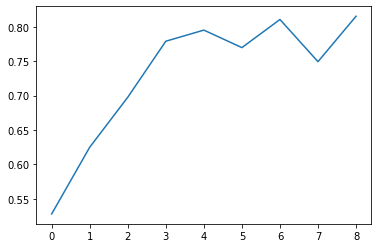

In [240]:
plt.plot(list_)

* so from the graph it is clear for depth = 3 we will get max accuracy
* let's try some other hyper parameter tunning 
* use gridsearchCV

In [241]:
param_grid = {'max_depth': [3,4,5,6,7,8,9, 10, 11],
             'max_features':[10,15,20],
             'min_samples_leaf':[1],
             }
dtr = DecisionTreeRegressor()
from sklearn.model_selection import GridSearchCV
best = GridSearchCV(dtr, param_grid, cv=3)


In [242]:
best.fit(X_train, y_train)
print(best.best_params_)

{'max_depth': 6, 'max_features': 10, 'min_samples_leaf': 1}


In [243]:
y_pred = best.predict(X_test)
metricss(y_test, y_pred)


Rsquare  0.7636203817814199
Accuracy 0.8789606507878076
AdjustedR_Square 0.75504310641383
F-statistics	 89.02831599260969
MSE 1078203361.2986653
MAE 23439.158531332618


* with decision tree results are not that good as I was expecting so let's move with random forest and try to implement it with both without hyperparameter tuninng as well as with.


### Random Forest using sklearn

In [244]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(n_estimators=50)
rfr.fit(X_train, y_train)
y_pred = rfr.predict(X_test)

metricss(y_test, y_pred)


Rsquare  0.8777671693100865
Accuracy 0.8789606507878076
AdjustedR_Square 0.8733318264675496
F-statistics	 197.90289059323987
MSE 557543200.6538209
MAE 16646.5268034188


In [245]:
import pydotplus
from IPython.display import Image
# Get the tree number 42
sub_tree_42 = rfr.estimators_[0]

dot_data = tree.export_graphviz(
    sub_tree_42,
    out_file=None, filled=True,
    rounded=True,  
    special_characters=True,
    proportion=True,
)
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.972921 to fit



In [246]:
# Create PDF
graph.write_pdf("rfr1.pdf")

# Create PNG
graph.write_png("rfr1.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.972921 to fit



True

##  now let's perform parameter tunning and try to increase the score 

In [247]:
print(rfr)

RandomForestRegressor(n_estimators=50)


In [248]:
for i in range(10, 1000, 50):
    rfr = RandomForestRegressor(n_estimators=i)
    rfr.fit(X_train, y_train)
    y_pred = rfr.predict(X_test)
    print('For i = ',i)
    metricss(y_test, y_pred)
    print('\n')

For i =  10
Rsquare  0.8749775658734866
Accuracy 0.8789606507878076
AdjustedR_Square 0.8704409994270603
F-statistics	 192.87220328553803
MSE 570267477.9189231
MAE 16783.746153846154


For i =  60
Rsquare  0.8811862557792635
Accuracy 0.8789606507878076
AdjustedR_Square 0.8768749779740286
F-statistics	 204.39097074869775
MSE 541947649.0939207
MAE 16257.247818477817


For i =  110
Rsquare  0.8837787294209871
Accuracy 0.8789606507878076
AdjustedR_Square 0.879561522164118
F-statistics	 209.56492664225698
MSE 530122544.1392292
MAE 15809.294219114221


For i =  160
Rsquare  0.8819212026479923
Accuracy 0.8789606507878076
AdjustedR_Square 0.8776365931389547
F-statistics	 205.83467426558582
MSE 538595320.3685794
MAE 15971.86014957265


For i =  210
Rsquare  0.8850164390295943
Accuracy 0.8789606507878076
AdjustedR_Square 0.8808441433273597
F-statistics	 212.11738145875003
MSE 524476953.0752909
MAE 15751.395864875865


For i =  260
Rsquare  0.8816521154854051
Accuracy 0.8789606507878076
AdjustedR_

In [249]:
for i in range(1,20,3):
    rfr = RandomForestRegressor(n_estimators=50, max_depth=i)
    rfr.fit(X_train, y_train)
    y_pred = rfr.predict(X_test)
    print('For i = ',i)
    metricss(y_test, y_pred)
    print('\n')

For i =  1
Rsquare  0.5593465313690096
Accuracy 0.8789606507878076
AdjustedR_Square 0.5433569711412042
F-statistics	 34.98198345670077
MSE 2009962003.604355
MAE 33946.10165989714


For i =  4
Rsquare  0.8418993199447358
Accuracy 0.8789606507878076
AdjustedR_Square 0.8361624756310976
F-statistics	 146.75303597542117
MSE 721147981.9785566
MAE 19633.410928510242


For i =  7
Rsquare  0.8764651137104289
Accuracy 0.8789606507878076
AdjustedR_Square 0.8719825244533901
F-statistics	 195.52652796241455
MSE 563482294.4501839
MAE 16701.84776729981


For i =  10
Rsquare  0.8838717576172865
Accuracy 0.8789606507878076
AdjustedR_Square 0.8796579259833354
F-statistics	 209.75488211153484
MSE 529698212.65624607
MAE 16250.760306415192


For i =  13
Rsquare  0.8776854472681651
Accuracy 0.8789606507878076
AdjustedR_Square 0.8732471390580452
F-statistics	 197.75225282167733
MSE 557915961.1352698
MAE 16269.588693511749


For i =  16
Rsquare  0.8849299762671452
Accuracy 0.8789606507878076
AdjustedR_Square 

In [250]:
for i in range(1,6):
    print("i = ", i)
    rfr = RandomForestRegressor(n_estimators=50, max_depth=7, max_features=4, random_state=12, n_jobs=i)
    rfr.fit(X_train, y_train)
    y_pred = rfr.predict(X_test)
    metricss(y_test, y_pred)
    print('\n')

i =  1
Rsquare  0.860741264292112
Accuracy 0.8789606507878076
AdjustedR_Square 0.855688119133021
F-statistics	 170.3377277305373
MSE 635203821.9792897
MAE 17228.252855800514


i =  2
Rsquare  0.860741264292112
Accuracy 0.8789606507878076
AdjustedR_Square 0.855688119133021
F-statistics	 170.3377277305373
MSE 635203821.9792895
MAE 17228.252855800514


i =  3
Rsquare  0.860741264292112
Accuracy 0.8789606507878076
AdjustedR_Square 0.855688119133021
F-statistics	 170.3377277305373
MSE 635203821.9792897
MAE 17228.252855800514


i =  4
Rsquare  0.860741264292112
Accuracy 0.8789606507878076
AdjustedR_Square 0.855688119133021
F-statistics	 170.3377277305373
MSE 635203821.9792897
MAE 17228.252855800514


i =  5
Rsquare  0.860741264292112
Accuracy 0.8789606507878076
AdjustedR_Square 0.855688119133021
F-statistics	 170.3377277305373
MSE 635203821.9792897
MAE 17228.252855800514




In [251]:
for i in range(1,6):
    print("i = ", i)
    rfr = RandomForestRegressor(n_estimators=50, max_depth=7,
                                max_features=4, random_state=12, n_jobs=1,
                               min_samples_leaf=i)
    rfr.fit(X_train, y_train)
    y_pred = rfr.predict(X_test)
    metricss(y_test, y_pred)
    print('\n')

i =  1
Rsquare  0.860741264292112
Accuracy 0.8789606507878076
AdjustedR_Square 0.855688119133021
F-statistics	 170.3377277305373
MSE 635203821.9792897
MAE 17228.252855800514


i =  2
Rsquare  0.8624808978678621
Accuracy 0.8789606507878076
AdjustedR_Square 0.8574908770861196
F-statistics	 172.84114347249124
MSE 627268794.4886055
MAE 17040.594086809208


i =  3
Rsquare  0.8641417265999141
Accuracy 0.8789606507878076
AdjustedR_Square 0.8592119706814478
F-statistics	 175.290976042635
MSE 619693221.2013013
MAE 16944.916794150027


i =  4
Rsquare  0.8619955199989676
Accuracy 0.8789606507878076
AdjustedR_Square 0.8569878867865502
F-statistics	 172.13631339082156
MSE 629482758.8468102
MAE 17104.225812408295


i =  5
Rsquare  0.858677973829938
Accuracy 0.8789606507878076
AdjustedR_Square 0.8535499600735004
F-statistics	 167.44845365361167
MSE 644615152.4840803
MAE 17284.394062754604




In [252]:
 # after doing some parameter tuning without gridsearchCV
rfr = RandomForestRegressor(n_estimators=50, max_depth=7,
                                max_features=4, random_state=12, n_jobs=1,
                               min_samples_leaf=2)
rfr.fit(X_train, y_train)

RandomForestRegressor(max_depth=7, max_features=4, min_samples_leaf=2,
                      n_estimators=50, n_jobs=1, random_state=12)

In [253]:
y_pred = rfr.predict(X_test)

In [254]:
metricss(y_test, y_pred)

Rsquare  0.8624808978678621
Accuracy 0.8789606507878076
AdjustedR_Square 0.8574908770861196
F-statistics	 172.84114347249124
MSE 627268794.4886055
MAE 17040.594086809208


## let's use Gradient Boosting 

In [255]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor(random_state=7)

In [256]:
gbr.fit(X_train, y_train)


GradientBoostingRegressor(random_state=7)

In [257]:
y_pred = gbr.predict(X_test)

In [258]:
metricss(y_test, y_pred)

Rsquare  0.9036869067996595
Accuracy 0.8789606507878076
AdjustedR_Square 0.9001920880495937
F-statistics	 258.57904842208654
MSE 439314952.82158065
MAE 14924.898547162225


* from above result it is clear that the results I got from the gradient boosting which were without hyper-parameter tuning are better than the results of RandomForest()
* now let's try to do some hyper-parameter tuning 

In [259]:
parameters = {
    "loss":["deviance"],
    "learning_rate": [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2],
    "min_samples_split": np.linspace(0.1, 0.5, 12),
    "min_samples_leaf": np.linspace(0.1, 0.5, 12),
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    "criterion": ["friedman_mse",  "mae"],
    "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
    "n_estimators":[10]
    }

In [260]:
best_model = GridSearchCV(GradientBoostingRegressor(), param_grid = parameters, cv=3)

In [261]:
from xgboost import XGBRegressor 
xgb = XGBRegressor(n_estimators=100, random_state=100,subsample=0.99, eta=0.2, max_depth=6)

In [262]:
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
metricss(y_test, y_pred)


Rsquare  0.8791326278722825
Accuracy 0.8789606507878076
AdjustedR_Square 0.8747468320853643
F-statistics	 200.44996862246077
MSE 551314905.5809673
MAE 16781.21141826923


# let's work with lightGbm


In [263]:
import lightgbm as lgm 

In [264]:
hyper_params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': ['l2', 'auc'],
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.7,
    'bagging_freq': 10,
    'verbose': 0,
    "max_depth": 8,
    "num_leaves": 128,  
    "max_bin": 512,
    "num_iterations": 100000,
    "n_estimators": 1000
}

In [265]:
gbm = lgm.LGBMRegressor(**hyper_params)


In [266]:
gbm.fit(X_train, y_train,
        eval_set=[(X_test, y_test)],
        eval_metric='l1',
        early_stopping_rounds=1000)

[1]	valid_0's l1: 52835.6	valid_0's l2: 4.5292e+09	valid_0's auc: 1
Training until validation scores don't improve for 1000 rounds
[2]	valid_0's l1: 52605.3	valid_0's l2: 4.49303e+09	valid_0's auc: 1
[3]	valid_0's l1: 52382.8	valid_0's l2: 4.45761e+09	valid_0's auc: 1
[4]	valid_0's l1: 52158.1	valid_0's l2: 4.42224e+09	valid_0's auc: 1
[5]	valid_0's l1: 51937.7	valid_0's l2: 4.38752e+09	valid_0's auc: 1
[6]	valid_0's l1: 51711.9	valid_0's l2: 4.35274e+09	valid_0's auc: 1
[7]	valid_0's l1: 51488	valid_0's l2: 4.31765e+09	valid_0's auc: 1
[8]	valid_0's l1: 51263	valid_0's l2: 4.2835e+09	valid_0's auc: 1
[9]	valid_0's l1: 51047	valid_0's l2: 4.24979e+09	valid_0's auc: 1
[10]	valid_0's l1: 50835.9	valid_0's l2: 4.21703e+09	valid_0's auc: 1
[11]	valid_0's l1: 50620	valid_0's l2: 4.18402e+09	valid_0's auc: 1
[12]	valid_0's l1: 50399.5	valid_0's l2: 4.15118e+09	valid_0's auc: 1
[13]	valid_0's l1: 50187.7	valid_0's l2: 4.11956e+09	valid_0's auc: 1
[14]	valid_0's l1: 49975.8	valid_0's l2: 4.088

/usr/local/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[60]	valid_0's l1: 41425.5	valid_0's l2: 2.92391e+09	valid_0's auc: 1
[61]	valid_0's l1: 41258	valid_0's l2: 2.90271e+09	valid_0's auc: 1
[62]	valid_0's l1: 41093.2	valid_0's l2: 2.88194e+09	valid_0's auc: 1
[63]	valid_0's l1: 40938.8	valid_0's l2: 2.86225e+09	valid_0's auc: 1
[64]	valid_0's l1: 40785.7	valid_0's l2: 2.84286e+09	valid_0's auc: 1
[65]	valid_0's l1: 40624.5	valid_0's l2: 2.82271e+09	valid_0's auc: 1
[66]	valid_0's l1: 40472.6	valid_0's l2: 2.80348e+09	valid_0's auc: 1
[67]	valid_0's l1: 40312.6	valid_0's l2: 2.78448e+09	valid_0's auc: 1
[68]	valid_0's l1: 40145.7	valid_0's l2: 2.76446e+09	valid_0's auc: 1
[69]	valid_0's l1: 39983.8	valid_0's l2: 2.74519e+09	valid_0's auc: 1
[70]	valid_0's l1: 39825.1	valid_0's l2: 2.72658e+09	valid_0's auc: 1
[71]	valid_0's l1: 39672.2	valid_0's l2: 2.70798e+09	valid_0's auc: 1
[72]	valid_0's l1: 39514	valid_0's l2: 2.6887e+09	valid_0's auc: 1
[73]	valid_0's l1: 39366	valid_0's l2: 2.67058e+09	valid_0's auc: 1
[74]	valid_0's l1: 39216.3	

[180]	valid_0's l1: 27317.6	valid_0's l2: 1.40822e+09	valid_0's auc: 1
[181]	valid_0's l1: 27240.5	valid_0's l2: 1.40109e+09	valid_0's auc: 1
[182]	valid_0's l1: 27171	valid_0's l2: 1.39468e+09	valid_0's auc: 1
[183]	valid_0's l1: 27093.7	valid_0's l2: 1.38761e+09	valid_0's auc: 1
[184]	valid_0's l1: 27023.7	valid_0's l2: 1.38119e+09	valid_0's auc: 1
[185]	valid_0's l1: 26955.2	valid_0's l2: 1.37488e+09	valid_0's auc: 1
[186]	valid_0's l1: 26886.9	valid_0's l2: 1.36878e+09	valid_0's auc: 1
[187]	valid_0's l1: 26815.7	valid_0's l2: 1.36251e+09	valid_0's auc: 1
[188]	valid_0's l1: 26745.6	valid_0's l2: 1.35636e+09	valid_0's auc: 1
[189]	valid_0's l1: 26678.5	valid_0's l2: 1.3503e+09	valid_0's auc: 1
[190]	valid_0's l1: 26611.2	valid_0's l2: 1.34437e+09	valid_0's auc: 1
[191]	valid_0's l1: 26536.6	valid_0's l2: 1.33793e+09	valid_0's auc: 1
[192]	valid_0's l1: 26469.3	valid_0's l2: 1.33184e+09	valid_0's auc: 1
[193]	valid_0's l1: 26399.8	valid_0's l2: 1.32565e+09	valid_0's auc: 1
[194]	val

[307]	valid_0's l1: 19917.5	valid_0's l2: 8.27286e+08	valid_0's auc: 1
[308]	valid_0's l1: 19875.8	valid_0's l2: 8.24448e+08	valid_0's auc: 1
[309]	valid_0's l1: 19833.5	valid_0's l2: 8.21569e+08	valid_0's auc: 1
[310]	valid_0's l1: 19793.6	valid_0's l2: 8.19223e+08	valid_0's auc: 1
[311]	valid_0's l1: 19749.6	valid_0's l2: 8.1631e+08	valid_0's auc: 1
[312]	valid_0's l1: 19705.8	valid_0's l2: 8.13416e+08	valid_0's auc: 1
[313]	valid_0's l1: 19664	valid_0's l2: 8.10626e+08	valid_0's auc: 1
[314]	valid_0's l1: 19622.5	valid_0's l2: 8.07865e+08	valid_0's auc: 1
[315]	valid_0's l1: 19579.8	valid_0's l2: 8.05061e+08	valid_0's auc: 1
[316]	valid_0's l1: 19537.2	valid_0's l2: 8.02315e+08	valid_0's auc: 1
[317]	valid_0's l1: 19494.2	valid_0's l2: 7.99581e+08	valid_0's auc: 1
[318]	valid_0's l1: 19451.8	valid_0's l2: 7.96867e+08	valid_0's auc: 1
[319]	valid_0's l1: 19409.8	valid_0's l2: 7.94199e+08	valid_0's auc: 1
[320]	valid_0's l1: 19367.8	valid_0's l2: 7.91557e+08	valid_0's auc: 1
[321]	val

[429]	valid_0's l1: 16506.4	valid_0's l2: 6.03292e+08	valid_0's auc: 1
[430]	valid_0's l1: 16489.1	valid_0's l2: 6.02017e+08	valid_0's auc: 1
[431]	valid_0's l1: 16476.4	valid_0's l2: 6.01245e+08	valid_0's auc: 1
[432]	valid_0's l1: 16458.8	valid_0's l2: 6.00078e+08	valid_0's auc: 1
[433]	valid_0's l1: 16441.6	valid_0's l2: 5.99043e+08	valid_0's auc: 1
[434]	valid_0's l1: 16427.7	valid_0's l2: 5.98207e+08	valid_0's auc: 1
[435]	valid_0's l1: 16414.2	valid_0's l2: 5.97395e+08	valid_0's auc: 1
[436]	valid_0's l1: 16398.8	valid_0's l2: 5.96482e+08	valid_0's auc: 1
[437]	valid_0's l1: 16387.2	valid_0's l2: 5.95747e+08	valid_0's auc: 1
[438]	valid_0's l1: 16369.7	valid_0's l2: 5.94779e+08	valid_0's auc: 1
[439]	valid_0's l1: 16356.7	valid_0's l2: 5.93982e+08	valid_0's auc: 1
[440]	valid_0's l1: 16342.1	valid_0's l2: 5.92956e+08	valid_0's auc: 1
[441]	valid_0's l1: 16324	valid_0's l2: 5.91846e+08	valid_0's auc: 1
[442]	valid_0's l1: 16307.9	valid_0's l2: 5.90677e+08	valid_0's auc: 1
[443]	va

[563]	valid_0's l1: 15099.3	valid_0's l2: 5.03681e+08	valid_0's auc: 1
[564]	valid_0's l1: 15094	valid_0's l2: 5.03072e+08	valid_0's auc: 1
[565]	valid_0's l1: 15083.9	valid_0's l2: 5.02305e+08	valid_0's auc: 1
[566]	valid_0's l1: 15075.1	valid_0's l2: 5.01585e+08	valid_0's auc: 1
[567]	valid_0's l1: 15070.2	valid_0's l2: 5.00969e+08	valid_0's auc: 1
[568]	valid_0's l1: 15061.1	valid_0's l2: 5.0024e+08	valid_0's auc: 1
[569]	valid_0's l1: 15053.8	valid_0's l2: 4.99598e+08	valid_0's auc: 1
[570]	valid_0's l1: 15044.8	valid_0's l2: 4.98882e+08	valid_0's auc: 1
[571]	valid_0's l1: 15038.2	valid_0's l2: 4.98493e+08	valid_0's auc: 1
[572]	valid_0's l1: 15032.1	valid_0's l2: 4.98156e+08	valid_0's auc: 1
[573]	valid_0's l1: 15025.6	valid_0's l2: 4.97775e+08	valid_0's auc: 1
[574]	valid_0's l1: 15019.2	valid_0's l2: 4.974e+08	valid_0's auc: 1
[575]	valid_0's l1: 15012.8	valid_0's l2: 4.9707e+08	valid_0's auc: 1
[576]	valid_0's l1: 15008.4	valid_0's l2: 4.96778e+08	valid_0's auc: 1
[577]	valid_

[712]	valid_0's l1: 14542.5	valid_0's l2: 4.5532e+08	valid_0's auc: 1
[713]	valid_0's l1: 14544.5	valid_0's l2: 4.55359e+08	valid_0's auc: 1
[714]	valid_0's l1: 14541.4	valid_0's l2: 4.55177e+08	valid_0's auc: 1
[715]	valid_0's l1: 14539	valid_0's l2: 4.54969e+08	valid_0's auc: 1
[716]	valid_0's l1: 14536.3	valid_0's l2: 4.5477e+08	valid_0's auc: 1
[717]	valid_0's l1: 14533.8	valid_0's l2: 4.54619e+08	valid_0's auc: 1
[718]	valid_0's l1: 14531.4	valid_0's l2: 4.54416e+08	valid_0's auc: 1
[719]	valid_0's l1: 14528.4	valid_0's l2: 4.54215e+08	valid_0's auc: 1
[720]	valid_0's l1: 14524.9	valid_0's l2: 4.54048e+08	valid_0's auc: 1
[721]	valid_0's l1: 14522.8	valid_0's l2: 4.53848e+08	valid_0's auc: 1
[722]	valid_0's l1: 14520.2	valid_0's l2: 4.53629e+08	valid_0's auc: 1
[723]	valid_0's l1: 14518.4	valid_0's l2: 4.53483e+08	valid_0's auc: 1
[724]	valid_0's l1: 14516.1	valid_0's l2: 4.53264e+08	valid_0's auc: 1
[725]	valid_0's l1: 14514	valid_0's l2: 4.5308e+08	valid_0's auc: 1
[726]	valid_0

[857]	valid_0's l1: 14285.3	valid_0's l2: 4.35176e+08	valid_0's auc: 1
[858]	valid_0's l1: 14284.1	valid_0's l2: 4.35044e+08	valid_0's auc: 1
[859]	valid_0's l1: 14281.3	valid_0's l2: 4.34796e+08	valid_0's auc: 1
[860]	valid_0's l1: 14278	valid_0's l2: 4.34432e+08	valid_0's auc: 1
[861]	valid_0's l1: 14277.6	valid_0's l2: 4.34292e+08	valid_0's auc: 1
[862]	valid_0's l1: 14277	valid_0's l2: 4.34141e+08	valid_0's auc: 1
[863]	valid_0's l1: 14276.6	valid_0's l2: 4.34005e+08	valid_0's auc: 1
[864]	valid_0's l1: 14276	valid_0's l2: 4.33857e+08	valid_0's auc: 1
[865]	valid_0's l1: 14275.4	valid_0's l2: 4.33712e+08	valid_0's auc: 1
[866]	valid_0's l1: 14275.5	valid_0's l2: 4.33584e+08	valid_0's auc: 1
[867]	valid_0's l1: 14275.1	valid_0's l2: 4.3348e+08	valid_0's auc: 1
[868]	valid_0's l1: 14274.5	valid_0's l2: 4.33338e+08	valid_0's auc: 1
[869]	valid_0's l1: 14272.8	valid_0's l2: 4.33169e+08	valid_0's auc: 1
[870]	valid_0's l1: 14271	valid_0's l2: 4.3307e+08	valid_0's auc: 1
[871]	valid_0's 

LGBMRegressor(bagging_fraction=0.7, bagging_freq=10, feature_fraction=0.9,
              learning_rate=0.005, max_bin=512, max_depth=8,
              metric=['l2', 'auc'], n_estimators=1000, num_iterations=100000,
              num_leaves=128, objective='regression', task='train', verbose=0)

In [267]:
y_pred = gbm.predict(X_test)


In [268]:
metricss(y_test, y_pred)

Rsquare  0.007042230804823024
Accuracy 0.8789606507878076
AdjustedR_Square -0.028988253883155624
F-statistics	 0.19545201419876032
MSE 4529199312.708387
MAE 52835.602704989855


In [269]:
print('The rmse of prediction is:', round(mean_squared_log_error(y_test, y_pred) ** 0.5, 5))

The rmse of prediction is: 0.38076
